In [ ]:
import cv2
from google.colab.patches import cv2_imshow

## Lab01: OpenCV

* Read image

In [ ]:
image = cv2.imread('/content/drive/MyDrive/ComputerVision/road.jpg') #read image

In [ ]:
h, w = image.shape[:2] #extract the heght and width
print('Height= {}, Width= {}'.format(h,w)) #display the height and width

Height= 1603, Width= 2400


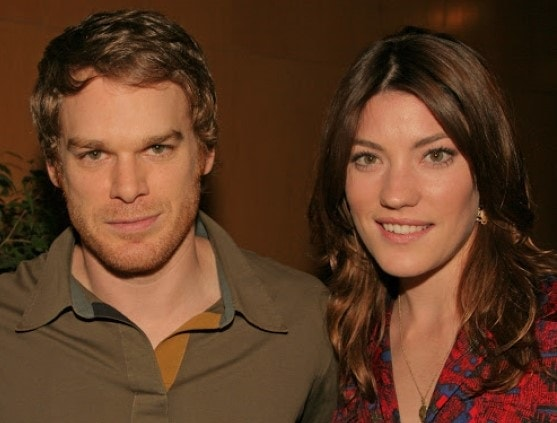

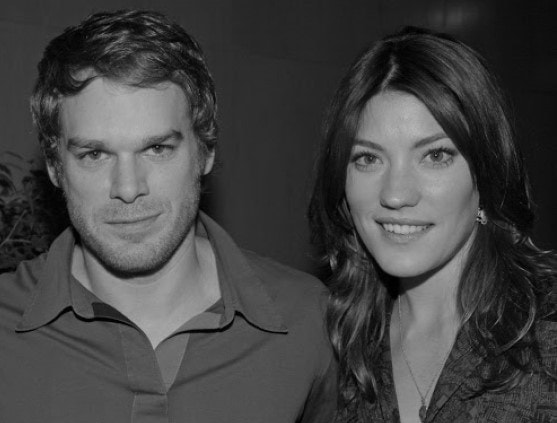

In [ ]:
img_1 = cv2.imread('/content/drive/MyDrive/ComputerVision/blood.png', 1) #colored image (the default)
img_2 = cv2.imread('/content/drive/MyDrive/ComputerVision/blood.png', 0) #black and white image
cv2_imshow(img_1)
cv2_imshow(img_2)

* RGB Value

In [ ]:
(B, G, R) = image[100, 100] #extract RGB values at pixel in range [100, 100] take the first 100 rows and 100 width
print('R= {}, G= {}, B= {}'.format(R, G, B)) #display the pixel values
G = image[100, 100, 1] #1 to read the green if 0 will read blue if 2 read red
print("G = {}".format(G))

R= 211, G= 172, B= 165
G = 172


* Resize image

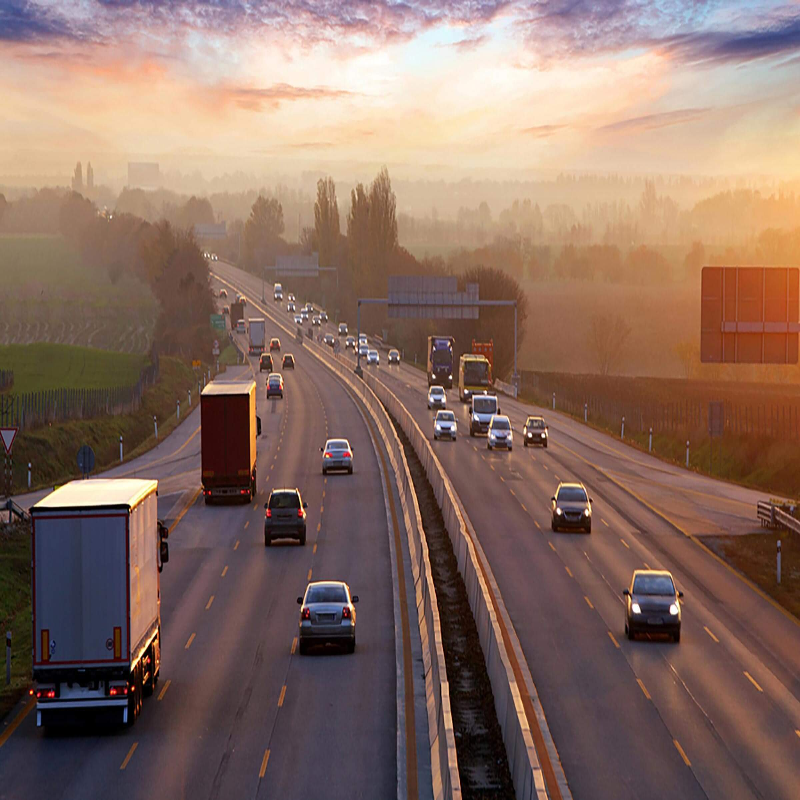

In [ ]:
resize = cv2.resize(image, (800, 800)) #resize function takes 2 parameter (the image, (dimenstions))
cv2_imshow(resize)

* Extracting the Region of interest

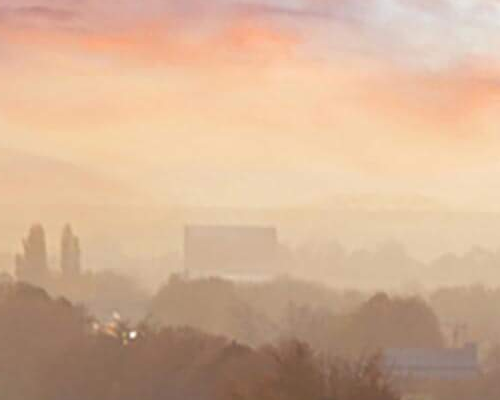

In [ ]:
roi = image[100:500, 200:700] #rake specefic values to extract it
cv2_imshow(roi)

* Rotating Image

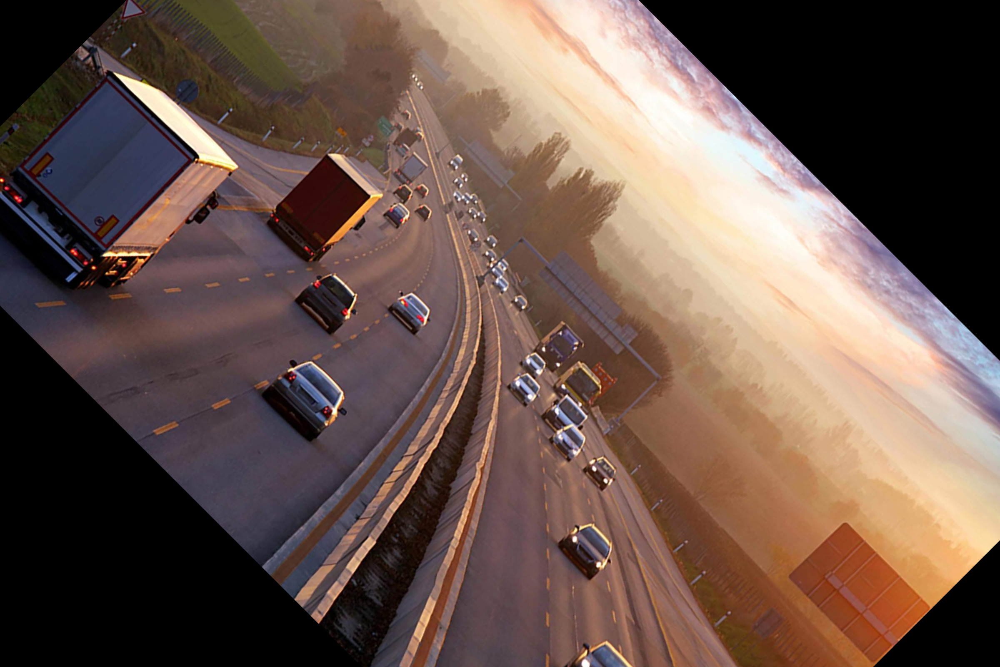

In [ ]:
center = (w//2, h//2) #calculate the center
matrix = cv2.getRotationMatrix2D(center, -45, 1.0) #rotate the image with .getRotationMatrix2D function it take the center value and the angle to rotate also the scale alpha and beta
rotated = cv2.warpAffine(image, matrix, (w,h)) 
cv2_imshow(rotated)

* Drawing Rectangle

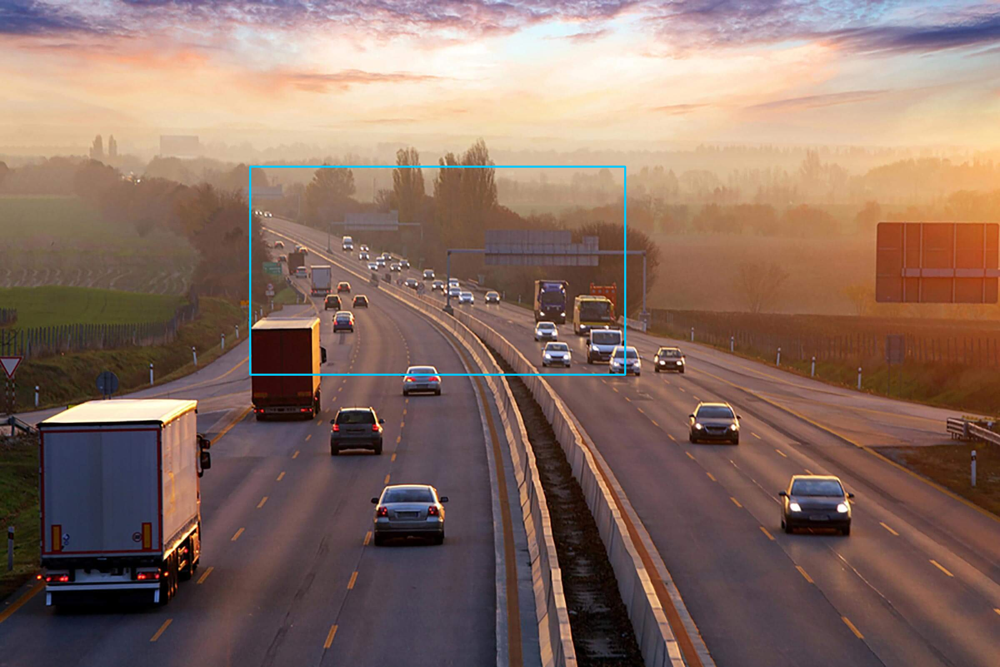

In [ ]:
output = image.copy() #copy of the image
rectangle = cv2.rectangle(output, (1500, 900), (600, 400), (255, 200, 0), 4) #the image - top left - bottom right - color RGB - line width
cv2_imshow(rectangle)

* Display Text

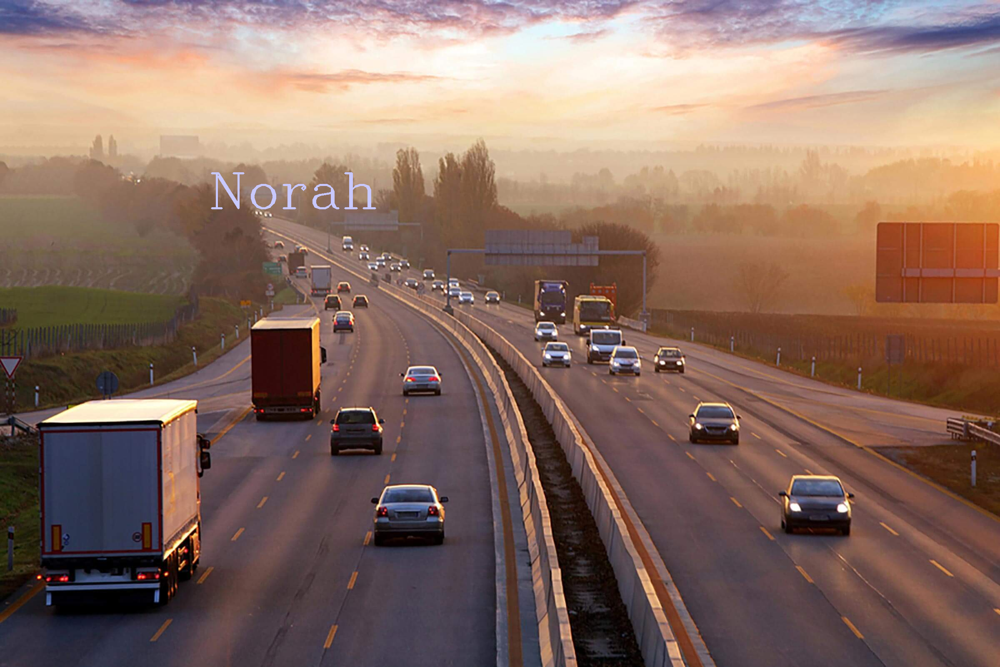

In [ ]:
output = image.copy() #copy of the image
text = cv2.putText(output, 'Norah', (500, 500), cv2.FONT_HERSHEY_COMPLEX, 4, (255, 200, 200), 4) #image - the text - bottom left - font - font size - text color RGB - line width
cv2_imshow(text)

* Draw line

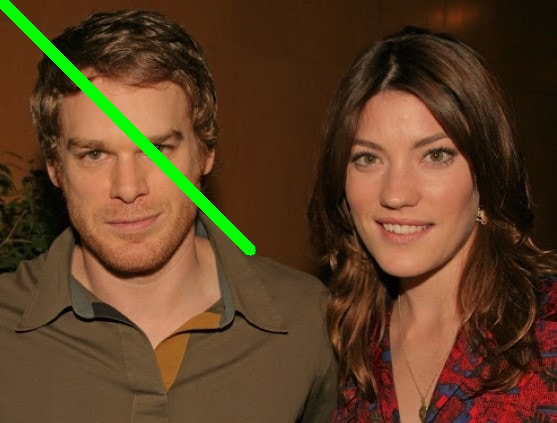

In [ ]:
start_point = (0, 0) #start point is at the top left corner
end_point = (250, 250) #end point is at the bottom right
color = (0, 255, 0) #green color in BGR
thickness = 9 #the line thickness
draw = cv2.line(img_1, start_point, end_point, color, thickness) #image - start point for line - end poit for line - line color - line thickness
cv2_imshow(draw)

* Draw circle

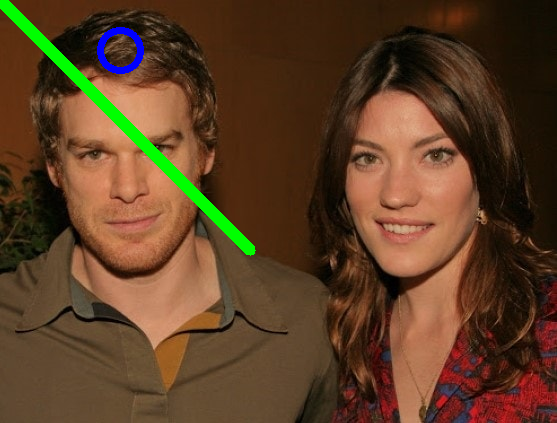

In [ ]:
center_coordinates = (120, 50)
radius = 20
color = (255, 0, 0)
thickness = 5
circle = cv2.circle(img_1, center_coordinates, radius, color, thickness) #image - center for the circle - circle radius - circle color - circle thickness
cv2_imshow(circle)

* PRACTICE For Lab01

In [ ]:
im = cv2.imread('/content/drive/MyDrive/ComputerVision/blood.png', 1) #colored image (the default)

In [ ]:
im = cv2.resize(im, (900, 900)) #resize function takes 2 parameter (the image, (dimenstions))

In [ ]:
im = cv2.rectangle(im, (200, 350), (350, 400), (255, 200, 0), 4) #the image - top left - bottom right - color RGB - line width

In [ ]:
im = cv2.putText(im, 'Norah', (500, 500), cv2.FONT_HERSHEY_COMPLEX, 4, (255, 200, 200), 4) #image - the text - bottom left - font - font size - text color RGB - line width

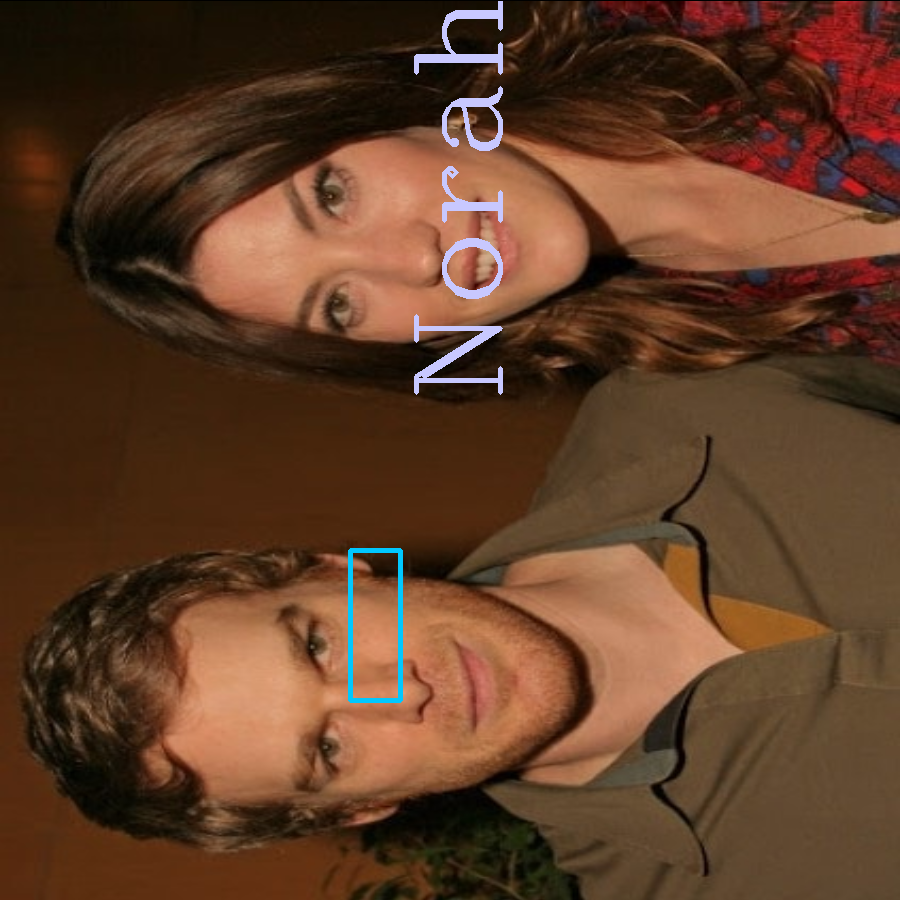

In [ ]:
h, w = im.shape[:2] #extract the heght and width
center = (w//2, h//2) #calculate the center
matrix = cv2.getRotationMatrix2D(center, 90, 1.0) #rotate the image with .getRotationMatrix2D function it take the center value and the angle to rotate also the scale alpha and beta
im = cv2.warpAffine(im, matrix, (w,h)) 
cv2_imshow(im)

## Lab02: Face Detection

* faceCascade: algorithm to detect fases

In [ ]:
imagePath = "/content/drive/MyDrive/ComputerVision/dex.jpg"
cascPath = "/content/drive/MyDrive/ComputerVision/haarcascade_frontalface_default.xml"

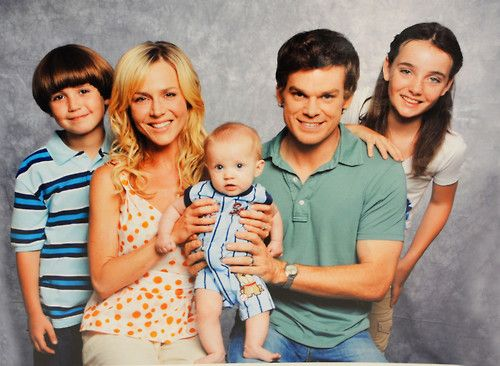

In [ ]:
faceCascade = cv2.CascadeClassifier(cascPath) #read the algorithm and save it in faceCascade
gray = cv2.imread(imagePath) #read image
cv2_imshow(gray) #display image

In [ ]:
faces = faceCascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30) ) #pass image to test 
print(faces) #display location of the faces

[[383  45  71  71]
 [ 44  74  58  58]
 [123  71  67  67]
 [276  68  74  74]
 [203 144  55  55]
 [ 27 284  72  72]]


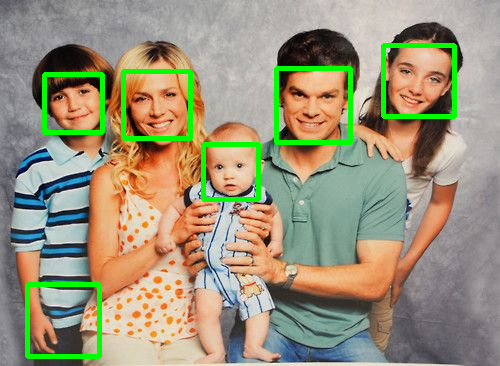

In [ ]:
for (x, y, w, h) in faces: #print rectangles in the faces location
    cv2.rectangle(gray, (x, y), (x+w, y+h), (0, 255,0), 4)
cv2_imshow(gray) #display image

* Edge Detection

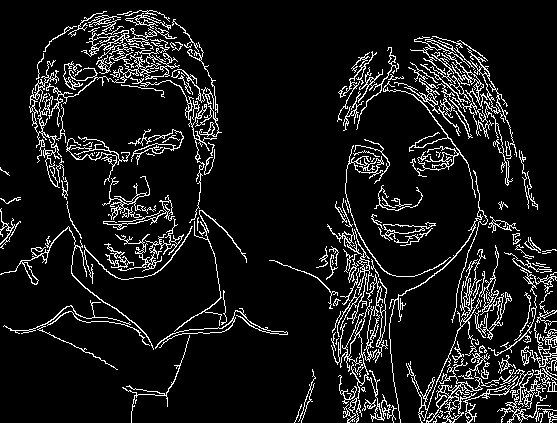

In [ ]:
img = cv2.imread('/content/drive/MyDrive/ComputerVision/blood.png', 1) #colored image (the default)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edged = cv2.Canny(gray, 30, 200) #Find Canny edges
cv2_imshow(edged)

* Contour Detection

Number of Contours found = 162


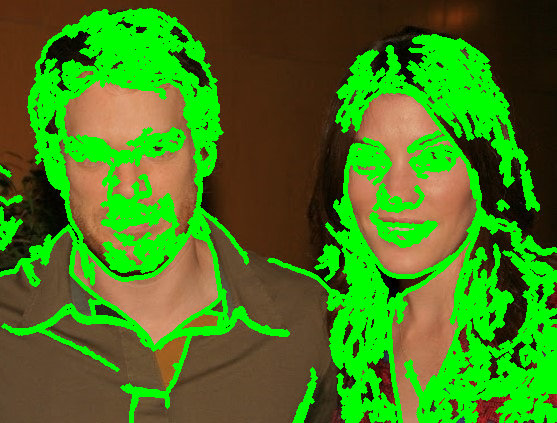

In [ ]:
contours, hierarchy = cv2.findContours(edged,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print("Number of Contours found = " + str(len(contours)))
cv2.drawContours(img, contours, -1, (0, 255, 0), 3) #Draw all contours # -1 signifies drawing all contours
cv2_imshow(img)

## Lab03: Extract Images From Video

In [ ]:
cam = cv2.VideoCapture('/content/drive/MyDrive/ComputerVision/python.mp4') #read video

In [ ]:
#cap = cv2.VideoCapture('python.mp4')

# Check if camera opened successfully
if (cap.isOpened()== False):
    print("Error opening video file")

# Read until video is completed
while(cap.isOpened()):
	
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret == True:
    
    	# Display the resulting frame
    	cv2.imshow('Frame', frame)
    
    	# Press Q on keyboard to exit
    	if cv2.waitKey(25) & 0xFF == ord('q'):
            break

# Break the loop
    else:
        break

# When everything done, release
# the video capture object
cap.release()

# Closes all the frames
cv2.destroyAllWindows()


In [ ]:
currentframe = 0 #frame
while(True):
	ret,frame = cam.read() 	#reading from frame
	if ret: #if video is still left continue creating images
		#name = '/content/drive/MyDrive/ComputerVision/PythonFrames' + str(currentframe) + '.jpg'
		print ('Creating...' + name)
		cv2.imwrite(name, frame) #writing the extracted images
		currentframe += 1 #increasing counter so that it will  #show how many frames are created
	else:
		break
cam.release() #Release all space and windows once done
cv2.destroyAllWindows()